<a href="https://colab.research.google.com/github/bburakerten/Clustering-Algorithm/blob/main/img2imgbeard.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install diffusers transformers accelerate torch



In [ ]:
import torch
from diffusers import StableDiffusionPipeline

model_id = "runwayml/stable-diffusion-v1-5"  # Stable Diffusion v1.5 model
pipe = StableDiffusionPipeline.from_pretrained(
    model_id, torch_dtype=torch.float16
)
pipe = pipe.to("cuda")  # move pipeline to GPU


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
base_description = "a portrait of a young man with short brown hair and green eyes, soft studio lighting, high quality"
prompt_no_beard = base_description + ", clean-shaven face, no beard"
prompt_with_beard = base_description + ", with a well-groomed thick beard"


In [ ]:
seed = 42
generator = torch.Generator(device="cuda").manual_seed(seed)

result_no_beard = pipe(prompt_no_beard, generator=generator, guidance_scale=7.5)
image_no_beard = result_no_beard.images[0]

generator = torch.Generator(device="cuda").manual_seed(seed)
result_beard = pipe(prompt_with_beard, generator=generator, guidance_scale=7.5)
image_with_beard = result_beard.images[0]

image_no_beard.save("example_no_beard.png")
image_with_beard.save("example_with_beard.png")


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline

img2img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_id, torch_dtype=torch.float16
).to("cuda")

init_image = image_no_beard.convert("RGB")
result_beard_img2img = img2img_pipe(prompt_with_beard, image=init_image, strength=0.5, guidance_scale=7.5)
image_with_beard_v2 = result_beard_img2img.images[0]
image_with_beard_v2.save("example_with_beard_img2img.png")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

In [ ]:
import os
from tqdm import trange

out_dir = "paired_faces_512"
os.makedirs(out_dir, exist_ok=True)

base_seed = 1000
num_pairs = 100

for i in trange(num_pairs, desc="Generating pairs"):
    seed = base_seed + i
    gen = torch.Generator(device="cuda").manual_seed(seed)
    img_no_beard = pipe(prompt_no_beard, generator=gen, guidance_scale=7.5).images[0]
    gen = torch.Generator(device="cuda").manual_seed(seed)
    img_beard = pipe(prompt_with_beard, generator=gen, guidance_scale=7.5).images[0]
    img_no_beard.save(f"{out_dir}/person_{i:03d}_nobeard.png")
    img_beard.save(f"{out_dir}/person_{i:03d}_beard.png")


Generating pairs:   0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:   1%|          | 1/100 [00:15<25:39, 15.55s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:   2%|▏         | 2/100 [00:31<25:40, 15.72s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:   3%|▎         | 3/100 [00:48<26:20, 16.30s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:   4%|▍         | 4/100 [01:05<26:20, 16.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:   5%|▌         | 5/100 [01:21<26:09, 16.52s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:   6%|▌         | 6/100 [01:38<25:45, 16.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:   7%|▋         | 7/100 [01:54<25:23, 16.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:   8%|▊         | 8/100 [02:10<25:08, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:   9%|▉         | 9/100 [02:27<24:54, 16.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  10%|█         | 10/100 [02:43<24:38, 16.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  11%|█         | 11/100 [03:00<24:24, 16.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  12%|█▏        | 12/100 [03:16<24:06, 16.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  13%|█▎        | 13/100 [03:32<23:49, 16.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  14%|█▍        | 14/100 [03:49<23:33, 16.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  15%|█▌        | 15/100 [04:05<23:17, 16.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  16%|█▌        | 16/100 [04:22<23:01, 16.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  17%|█▋        | 17/100 [04:38<22:47, 16.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  18%|█▊        | 18/100 [04:55<22:29, 16.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  19%|█▉        | 19/100 [05:11<22:11, 16.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  20%|██        | 20/100 [05:28<21:54, 16.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  21%|██        | 21/100 [05:44<21:35, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  22%|██▏       | 22/100 [06:00<21:19, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  23%|██▎       | 23/100 [06:17<21:02, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  24%|██▍       | 24/100 [06:33<20:46, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  25%|██▌       | 25/100 [06:50<20:31, 16.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  26%|██▌       | 26/100 [07:06<20:17, 16.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
Generating pairs:  27%|██▋       | 27/100 [07:22<19:59, 16.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  28%|██▊       | 28/100 [07:39<19:44, 16.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  29%|██▉       | 29/100 [07:55<19:29, 16.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  30%|███       | 30/100 [08:12<19:10, 16.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  31%|███       | 31/100 [08:28<18:54, 16.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  32%|███▏      | 32/100 [08:45<18:38, 16.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  33%|███▎      | 33/100 [09:01<18:20, 16.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  34%|███▍      | 34/100 [09:18<18:03, 16.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  35%|███▌      | 35/100 [09:34<17:47, 16.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  36%|███▌      | 36/100 [09:50<17:29, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  37%|███▋      | 37/100 [10:07<17:13, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  38%|███▊      | 38/100 [10:23<16:56, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  39%|███▉      | 39/100 [10:39<16:39, 16.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  40%|████      | 40/100 [10:56<16:23, 16.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  41%|████      | 41/100 [11:12<16:06, 16.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  42%|████▏     | 42/100 [11:29<15:49, 16.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  43%|████▎     | 43/100 [11:45<15:33, 16.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  44%|████▍     | 44/100 [12:01<15:16, 16.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  45%|████▌     | 45/100 [12:18<15:00, 16.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  46%|████▌     | 46/100 [12:34<14:44, 16.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  47%|████▋     | 47/100 [12:50<14:28, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  48%|████▊     | 48/100 [13:07<14:12, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  49%|████▉     | 49/100 [13:23<13:56, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  50%|█████     | 50/100 [13:40<13:39, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  51%|█████     | 51/100 [13:56<13:22, 16.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  52%|█████▏    | 52/100 [14:12<13:06, 16.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  53%|█████▎    | 53/100 [14:29<12:50, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  54%|█████▍    | 54/100 [14:45<12:33, 16.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  55%|█████▌    | 55/100 [15:02<12:16, 16.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  56%|█████▌    | 56/100 [15:18<12:01, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  57%|█████▋    | 57/100 [15:34<11:44, 16.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  58%|█████▊    | 58/100 [15:51<11:28, 16.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  59%|█████▉    | 59/100 [16:07<11:12, 16.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  60%|██████    | 60/100 [16:24<10:55, 16.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  61%|██████    | 61/100 [16:40<10:39, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  62%|██████▏   | 62/100 [16:56<10:24, 16.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  63%|██████▎   | 63/100 [17:13<10:07, 16.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  64%|██████▍   | 64/100 [17:29<09:50, 16.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  65%|██████▌   | 65/100 [17:46<09:34, 16.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  66%|██████▌   | 66/100 [18:02<09:16, 16.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  67%|██████▋   | 67/100 [18:18<09:00, 16.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  68%|██████▊   | 68/100 [18:35<08:44, 16.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  69%|██████▉   | 69/100 [18:51<08:27, 16.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  70%|███████   | 70/100 [19:07<08:11, 16.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  71%|███████   | 71/100 [19:24<07:54, 16.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  72%|███████▏  | 72/100 [19:40<07:38, 16.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  73%|███████▎  | 73/100 [19:57<07:21, 16.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  74%|███████▍  | 74/100 [20:13<07:06, 16.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  75%|███████▌  | 75/100 [20:29<06:50, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  76%|███████▌  | 76/100 [20:46<06:33, 16.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  77%|███████▋  | 77/100 [21:02<06:17, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  78%|███████▊  | 78/100 [21:19<06:00, 16.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  79%|███████▉  | 79/100 [21:35<05:44, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  80%|████████  | 80/100 [21:51<05:28, 16.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  81%|████████  | 81/100 [22:08<05:12, 16.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  82%|████████▏ | 82/100 [22:24<04:55, 16.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  83%|████████▎ | 83/100 [22:41<04:39, 16.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  84%|████████▍ | 84/100 [22:57<04:23, 16.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  85%|████████▌ | 85/100 [23:14<04:06, 16.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  86%|████████▌ | 86/100 [23:30<03:49, 16.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  87%|████████▋ | 87/100 [23:46<03:33, 16.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  88%|████████▊ | 88/100 [24:03<03:17, 16.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  89%|████████▉ | 89/100 [24:19<03:00, 16.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  90%|█████████ | 90/100 [24:36<02:44, 16.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  91%|█████████ | 91/100 [24:52<02:27, 16.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  92%|█████████▏| 92/100 [25:09<02:11, 16.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  93%|█████████▎| 93/100 [25:25<01:54, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  94%|█████████▍| 94/100 [25:41<01:38, 16.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  95%|█████████▌| 95/100 [25:58<01:21, 16.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  96%|█████████▌| 96/100 [26:14<01:05, 16.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  97%|█████████▋| 97/100 [26:31<00:49, 16.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  98%|█████████▊| 98/100 [26:47<00:32, 16.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs:  99%|█████████▉| 99/100 [27:03<00:16, 16.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating pairs: 100%|██████████| 100/100 [27:20<00:00, 16.40s/it]


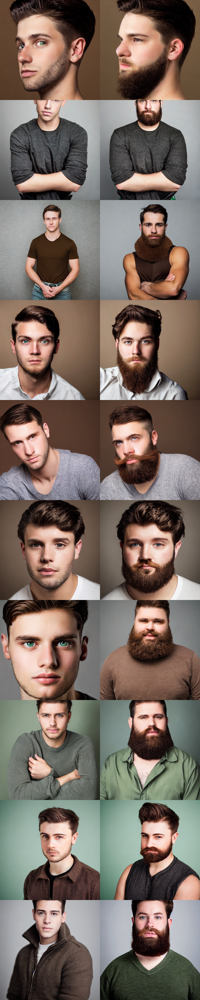

In [ ]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols
    w, h = imgs[0].size
    grid_img = Image.new("RGB", size=(cols * w, rows * h))
    for idx, img in enumerate(imgs):
        grid_x = (idx % cols) * w
        grid_y = (idx // cols) * h
        grid_img.paste(img, (grid_x, grid_y))
    return grid_img

sample_imgs = []
for j in range(10):
    no_beard_img = Image.open(f"{out_dir}/person_{j:03d}_nobeard.png")
    beard_img    = Image.open(f"{out_dir}/person_{j:03d}_beard.png")
    no_beard_img = no_beard_img.resize((512,512))
    beard_img    = beard_img.resize((512,512))
    sample_imgs.extend([no_beard_img, beard_img])

grid = image_grid(sample_imgs, rows=10, cols=2)
grid.save("preview_grid.png")
grid


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 124.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

▶ Starting training…
Epoch 1/30  lossD 0.6688  lossG 42.3917
Epoch 2/30  lossD 0.6411  lossG 35.4204
Epoch 3/30  lossD 0.6021  lossG 33.4867
Epoch 4/30  lossD 0.5879  lossG 31.5444
Epoch 5/30  lossD 0.5238  lossG 34.6705
Epoch 6/30  lossD 0.5958  lossG 25.1722
Epoch 7/30  lossD 0.4939  lossG 24.4044
Epoch 8/30  lossD 0.4680  lossG 27.4273
Epoch 9/30  lossD 0.4063  lossG 29.5925
Epoch 10/30  lossD 0.3994  lossG 25.7535
Epoch 11/30  lossD 0.3609  lossG 25.3244
Epoch 12/30  lossD 0.4003  lossG 33.9728
Epoch 13/30  lossD 0.3039  lossG 29.2090
Epoch 14/30  lossD 0.2234  lossG 32.6536
Epoch 15/30  lossD 0.3231  lossG 30.0188
Epoch 16/30  lossD 0.2143  lossG 27.9569
Epoch 17/30  lossD 0.2667  lossG 27.2354
Epoch 18/30  lossD 0.6905  lossG 30.6228
Epoch 19/30  lossD 0.4801  lossG 27.4004
Epoch 20/30  lossD 0.4551  lossG 24.3950
Epoch 21/30  lossD 0.5689  lossG 27.6293
Epoch 22/30  lossD 0.2543  lossG 33.9517
Epoch 23/30  lossD 0.2656  lossG 29.3405
Epoch 24/30  lossD 0.5806  lossG 22.8500
Epoc

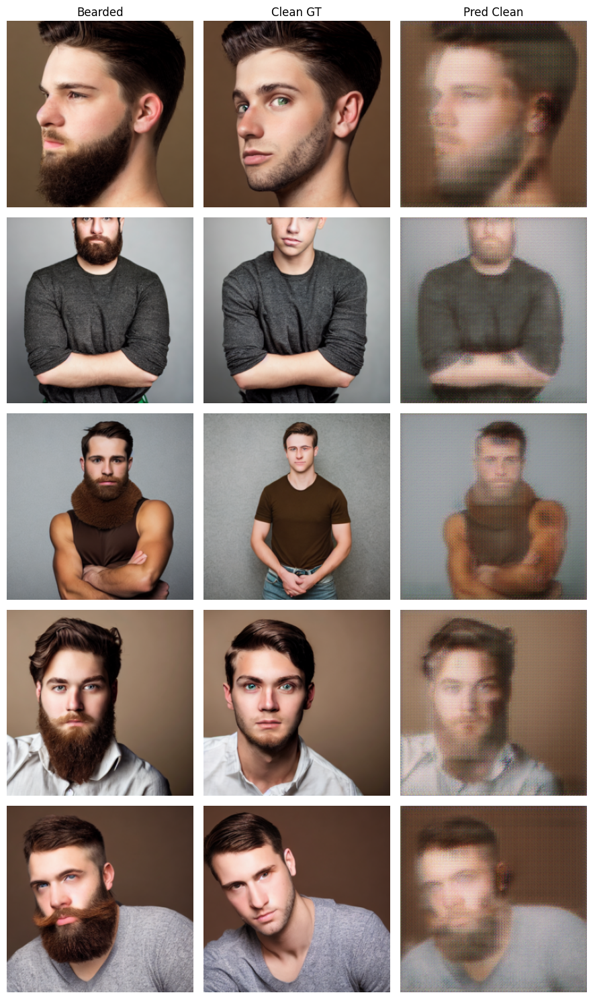

In [34]:
#!/usr/bin/env python3
"""
beard_img2img.py

Train & test a lightweight Pix2Pix‐style img2img model
(bearded → clean‐shaven) at 256×256 resolution.
All settings are hard‐coded so you can just run `python beard_img2img.py`
"""

import os
from types import SimpleNamespace

from PIL import Image
import torch
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from matplotlib import pyplot as plt

# --------------------------------------------------
#  Dataset
# --------------------------------------------------
class BeardPairDataset(Dataset):
    def __init__(self, root_dir, resolution=256):
        self.root = root_dir
        files = sorted(f for f in os.listdir(root_dir) if f.endswith(".png"))
        self.ids = sorted({f.split('_')[1] for f in files})
        self.tf = T.Compose([
            T.Resize((resolution, resolution)),
            T.ToTensor(),
            T.Normalize((0.5,)*3, (0.5,)*3)
        ])
    def __len__(self):
        return len(self.ids)
    def __getitem__(self, idx):
        sid = self.ids[idx]
        A = Image.open(os.path.join(self.root, f"person_{sid}_beard.png")).convert("RGB")
        B = Image.open(os.path.join(self.root, f"person_{sid}_nobeard.png")).convert("RGB")
        return self.tf(A), self.tf(B)

# --------------------------------------------------
#  Models
# --------------------------------------------------
class UNetGenerator(nn.Module):
    def __init__(self, base_ch=32):
        super().__init__()
        self.enc1 = nn.Sequential(nn.Conv2d(3, base_ch, 4,2,1), nn.LeakyReLU(0.2))
        self.enc2 = nn.Sequential(nn.Conv2d(base_ch, base_ch*2, 4,2,1),
                                  nn.BatchNorm2d(base_ch*2), nn.LeakyReLU(0.2))
        self.enc3 = nn.Sequential(nn.Conv2d(base_ch*2, base_ch*4, 4,2,1),
                                  nn.BatchNorm2d(base_ch*4), nn.LeakyReLU(0.2))
        self.bot  = nn.Sequential(nn.Conv2d(base_ch*4, base_ch*8, 4,2,1), nn.ReLU())
        self.dec3 = nn.Sequential(nn.ConvTranspose2d(base_ch*8, base_ch*4, 4,2,1),
                                  nn.BatchNorm2d(base_ch*4), nn.ReLU())
        self.dec2 = nn.Sequential(nn.ConvTranspose2d(base_ch*8, base_ch*2, 4,2,1),
                                  nn.BatchNorm2d(base_ch*2), nn.ReLU())
        self.dec1 = nn.Sequential(nn.ConvTranspose2d(base_ch*4, base_ch,   4,2,1),
                                  nn.BatchNorm2d(base_ch),   nn.ReLU())
        self.out  = nn.ConvTranspose2d(base_ch*2, 3, 4,2,1)
    def forward(self, x):
        e1 = self.enc1(x); e2 = self.enc2(e1); e3 = self.enc3(e2)
        b = self.bot(e3)
        d3 = self.dec3(b)
        d2 = self.dec2(torch.cat([d3,e3],1))
        d1 = self.dec1(torch.cat([d2,e2],1))
        return torch.tanh(self.out(torch.cat([d1,e1],1)))

class PatchDiscriminator(nn.Module):
    def __init__(self, base_ch=32):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(6, base_ch,   4,2,1), nn.LeakyReLU(0.2),
            nn.Conv2d(base_ch, base_ch*2, 4,2,1), nn.BatchNorm2d(base_ch*2), nn.LeakyReLU(0.2),
            nn.Conv2d(base_ch*2, base_ch*4, 4,2,1), nn.BatchNorm2d(base_ch*4), nn.LeakyReLU(0.2),
            nn.Conv2d(base_ch*4, 1, 4,1,1)
        )
    def forward(self, x):
        return self.net(x)

# --------------------------------------------------
#  Checkpoint Utils
# --------------------------------------------------
def save_ckpt(model, opt, epoch, d, name):
    os.makedirs(d, exist_ok=True)
    path = os.path.join(d, f"{name}_epoch{epoch:03d}.pt")
    torch.save({"model":model.state_dict(), "opt":opt.state_dict()}, path)

def load_ckpt(model, path, device):
    ck = torch.load(path, map_location=device)
    model.load_state_dict(ck["model"])

# --------------------------------------------------
#  Training
# --------------------------------------------------
def train_model(args):
    ds = BeardPairDataset(args.data_root, args.resolution)
    dl = DataLoader(ds, batch_size=args.batch_size, shuffle=True, num_workers=2, pin_memory=True)
    device = torch.device(args.device)
    G = UNetGenerator().to(device)
    D = PatchDiscriminator().to(device)
    optG = Adam(G.parameters(), lr=args.lr, betas=(0.5,0.999))
    optD = Adam(D.parameters(), lr=args.lr, betas=(0.5,0.999))
    lossBCE = nn.BCEWithLogitsLoss()
    lossL1  = nn.L1Loss()
    real, fake = 1.0, 0.0

    for ep in range(1, args.epochs+1):
        for A,B in dl:
            A,B = A.to(device), B.to(device)
            # D real
            D_real = D(torch.cat([A,B],1))
            lD_real = lossBCE(D_real, torch.full_like(D_real, real))
            # D fake
            fake_B = G(A)
            D_fake = D(torch.cat([A,fake_B.detach()],1))
            lD_fake = lossBCE(D_fake, torch.full_like(D_fake, fake))
            lD = 0.5*(lD_real+lD_fake)
            optD.zero_grad(); lD.backward(); optD.step()
            # G step
            Df = D(torch.cat([A,fake_B],1))
            lG = lossBCE(Df, torch.full_like(Df, real)) + 100*lossL1(fake_B,B)
            optG.zero_grad(); lG.backward(); optG.step()

        print(f"Epoch {ep}/{args.epochs}  lossD {lD.item():.4f}  lossG {lG.item():.4f}")
        save_ckpt(G,optG,ep,args.checkpoint_dir,"G")

    return os.path.join(args.checkpoint_dir, f"G_epoch{args.epochs:03d}.pt")

# --------------------------------------------------
#  Testing & Saving
# --------------------------------------------------
def test_and_save(args, ckpt, out_path="/content/test_results.png"):
    ds = BeardPairDataset(args.data_root, args.resolution)
    dl = DataLoader(ds, batch_size=args.test_batch_size, shuffle=False)
    device = torch.device(args.device)
    G = UNetGenerator().to(device)
    load_ckpt(G, ckpt, device)
    G.eval()

    A,B = next(iter(dl))
    A = A.to(device)
    with torch.no_grad():
        fake_B = G(A)

    n = min(5, A.size(0))
    fig,axs = plt.subplots(n,3,figsize=(9,3*n))
    for i in range(n):
        for j,img in enumerate((A,B.to(device),fake_B)):
            im = img[i].cpu().permute(1,2,0)*0.5+0.5
            axs[i,j].imshow(im.clamp(0,1))
            axs[i,j].axis("off")
    axs[0,0].set_title("Bearded")
    axs[0,1].set_title("Clean GT")
    axs[0,2].set_title("Pred Clean")
    plt.tight_layout()

    fig.savefig(out_path)
    print(f"✔ Test results image saved to: {out_path}")

# --------------------------------------------------
#  Main
# --------------------------------------------------
if __name__ == "__main__":
    # hard-coded settings
    args = SimpleNamespace(
        data_root       = "/content/paired_faces_512",
        checkpoint_dir  = "/content/checkpoints",
        epochs          = 30,
        batch_size      = 16,
        test_batch_size = 8,
        resolution      = 256,
        lr              = 2e-4,
        device          = "cuda",
    )
    os.makedirs(args.checkpoint_dir, exist_ok=True)

    print("▶ Starting training…")
    final_ckpt = train_model(args)
    print(f"✔ Training complete. Checkpoint: {final_ckpt}\n")

    print("▶ Running test + saving results…")
    test_and_save(args, final_ckpt, out_path="/content/test_results.png")
    print("✅ All done!")


example_no_beard.png            example_with_beard.png  preview_grid.png
example_with_beard_img2img.png  paired_faces_512/       sample_data/


The file 'test_results.png' was not found in the current directory.
